# Mass-Spring-Damper System:  Analyzing the Principal Components of the $R_{XV}$Data Matrix

In [1]:
### Importing Libraries

import sys
print(sys.version)
import os
import time


### Defining WORKSPACE_PATH

# WORKSPACE_PATH = os.environ['WORKSPACE_PATH']
WORKSPACE_PATH = os.path.join(os.getcwd(), '../../../../../')
ROMNet_fld     = os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/')


### Importing External Libraries

import numpy                             as np
import pandas                            as pd


### Importing Matplotlib and Its Style

import matplotlib.pyplot                 as plt

#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/presentation.mplstyle'))
plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/zoomed.mplstyle'))
#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/paper_1column.mplstyle'))
#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/paper_2columns.mplstyle'))


# from scipy.integrate import solve_ivp
# import pyDOE
from PCAfold         import PCA          as PCAA

3.8.11 (default, Jun 29 2021, 03:17:05) 
[Clang 12.0.0 (clang-1200.0.32.29)]


Missing colon in file PosixPath('/Users/sventur/.matplotlib/stylelib/paper_2columns.mplstyle'), line 1 ('f#### MATPLOTLIBRC FORMAT')


## Defining Input Variables

In [2]:
OutputDir       = os.path.join(WORKSPACE_PATH, 'ROMNet/Data/MSD_100Cases/Orig/')
FigDir          = os.path.join(WORKSPACE_PATH, '../Desktop/Paper_Figures_DeepONet_TEMP/')

Vars            = ['x', 'v']
NVars           = len(Vars)

n_ics           = 100
valid_perc      = 20

PCAType         = 'All'
mode_name       = 'All'

n_modesFinal    = 2
    

ColorVec        = ['#190707', '#dd3232', '#0065a9', '#348a00','#985396','#f68b69']

try:
    os.makedirs(OutputDir+'/'+str(PCAType))
except:
    pass

## Loading Training Data

In [3]:
Cols   = []
NewFlg = True
for iC in range(n_ics):

    FileName             = OutputDir+'/train/ext/y.csv.'+str(iC+1)
    Data                 = pd.read_csv(FileName, header=0)
    DataTemp             = Data[Vars]
    VarsTemp             = [Var+'_'+str(iC+1) for Var in Vars]
    DataTemp.columns     = VarsTemp


    for jVar in range(NVars):
        if (np.abs( (DataTemp[VarsTemp[jVar]][0] - DataTemp[VarsTemp[jVar]][len(Data)-1])/DataTemp[VarsTemp[jVar]][0] ) > 1.e-3): 
            DataICTemp  = Data[Vars].iloc[0]
            if (NewFlg):
                DataInput        = DataTemp[VarsTemp[jVar]]
                if (jVar == 0):
                    DataIC           = DataICTemp
                NewFlg           = False
            else:
                DataInput        = pd.concat([DataInput, DataTemp[VarsTemp[jVar]]], axis=1)
                if (jVar == 0):
                    DataIC           = pd.concat([DataIC, DataICTemp], axis=1)
            #Cols.append(str(iC+1))
            Cols = Cols+[str(iC+1)+'_'+Vars[jVar]]

tVec              = Data['t']

yMat              = DataInput.to_numpy()
    
DataIC            = DataIC.T.reset_index(drop=True, inplace=False)

WList = []
for i in range(2):
    WList.append(np.arange(i,200,2))

In [4]:
ICs = DataIC.to_numpy()

## Estimating the Required Number of Singular Values

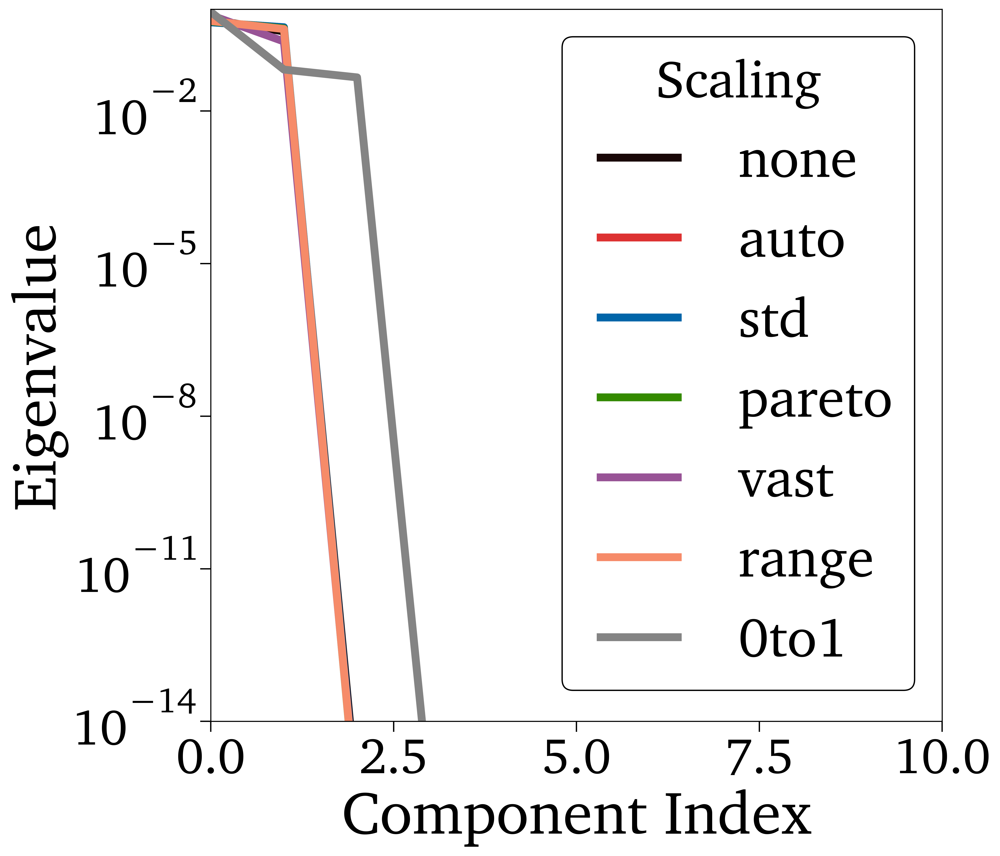

In [5]:
n_modes      = 64
ScalingVec = ['none', 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
#'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

plt.figure()
for j, Scaling in enumerate(ScalingVec):

    pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes))
    C          = pca.X_center
    D          = pca.X_scale
    A          = pca.A[:,0:n_modes].T
    L          = pca.L
    AT         = A.T

    plt.plot(L, label=Scaling)
    
plt.ylim([1.e-14, 1.e0])
plt.xlabel('Component Index')
plt.ylabel('Eigenvalue')
plt.yscale('log')
plt.legend(title='Scaling')
plt.xlim([0,10])

if (FigDir):
    plt.savefig(FigDir+'/MSD_Eigenvalues_All.eps', format='eps', bbox_inches='tight')

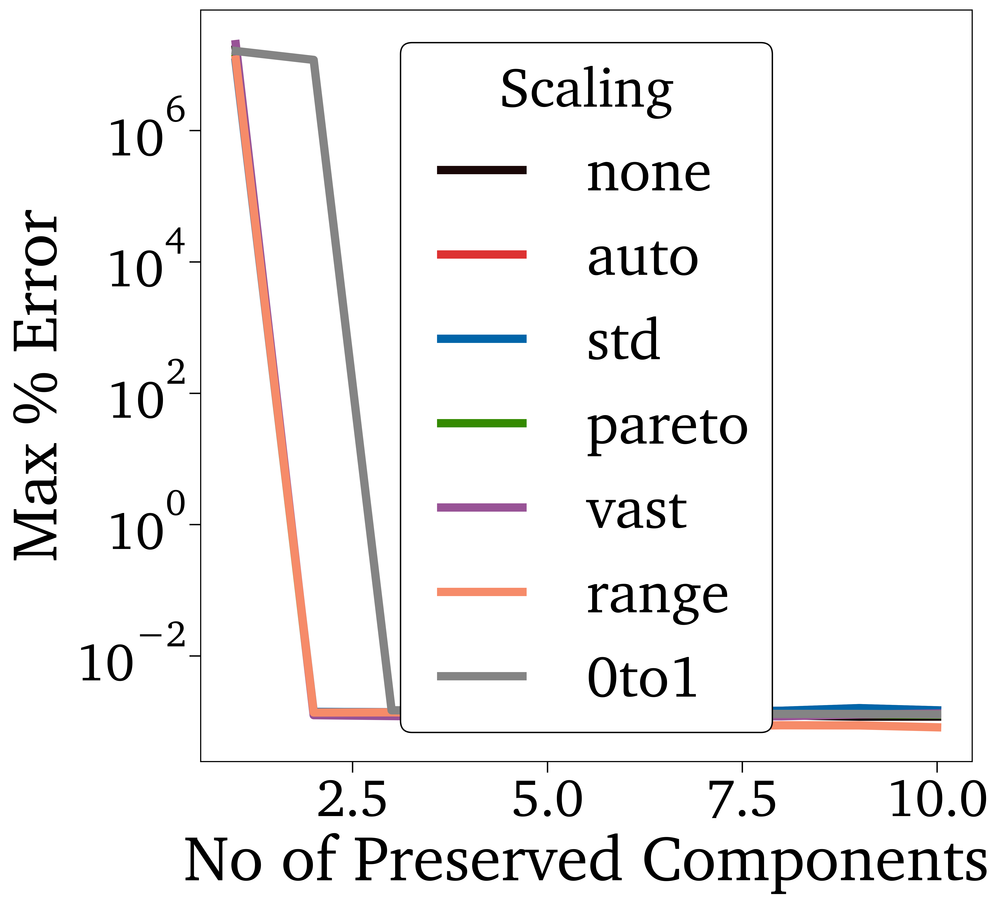

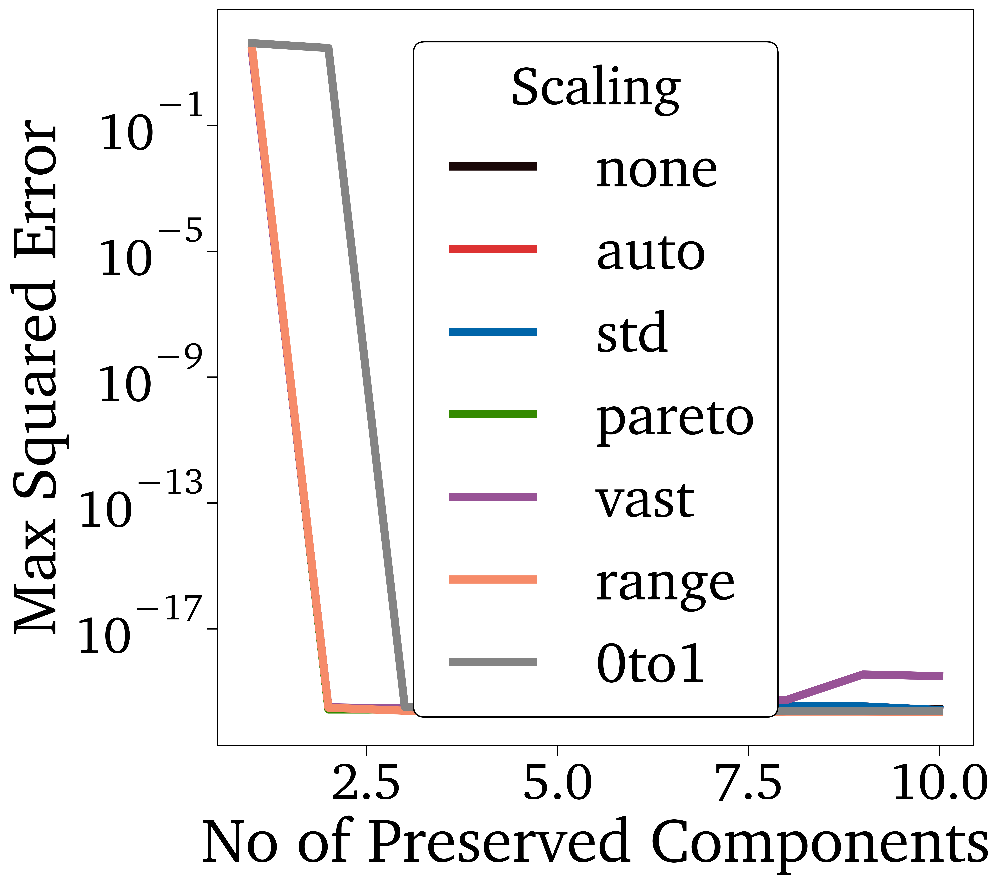

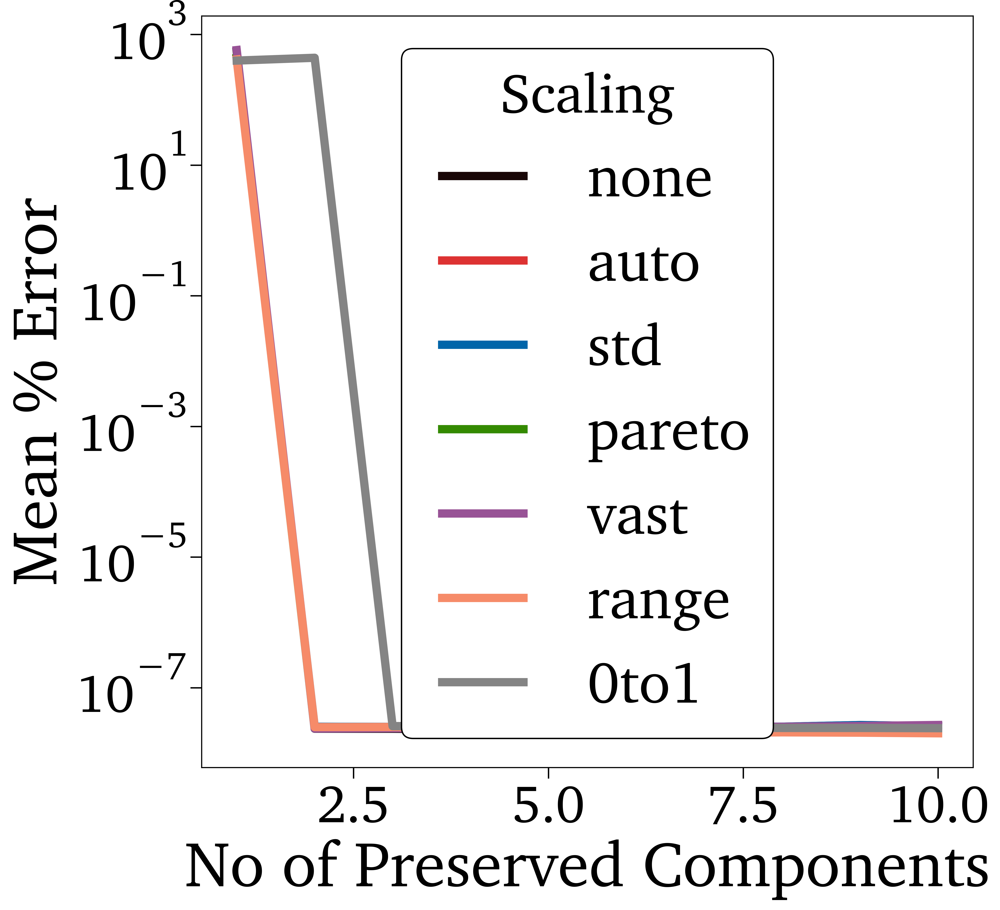

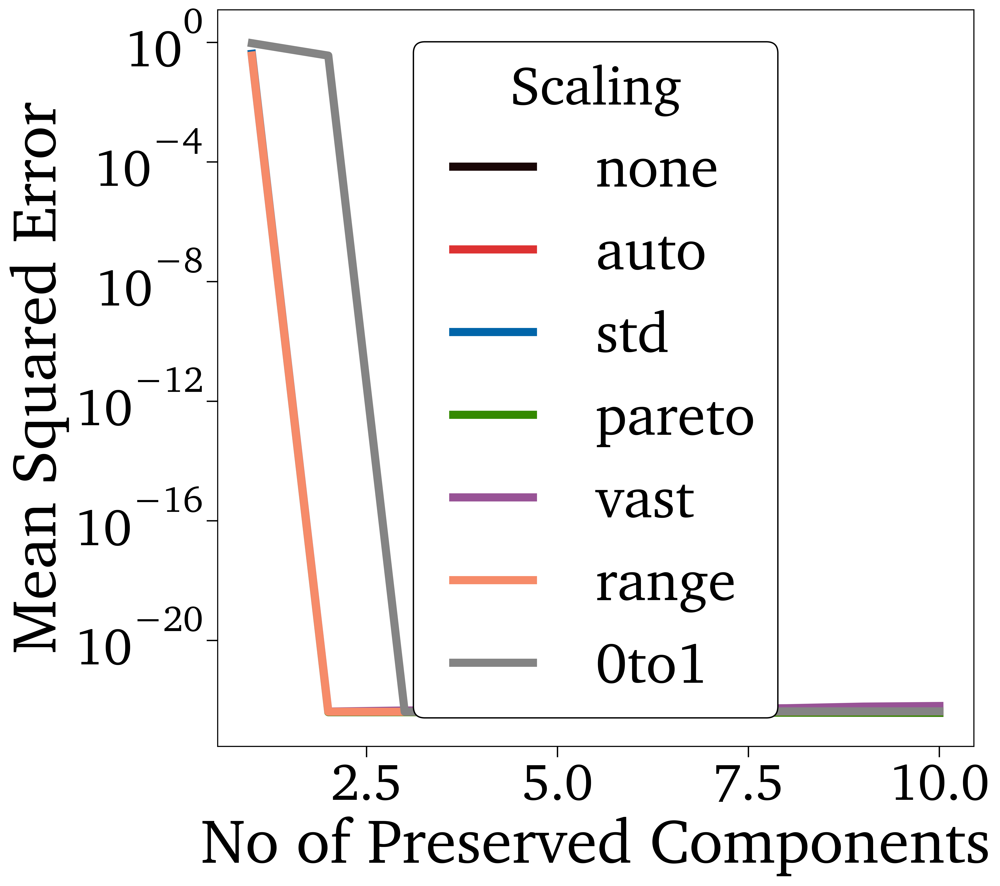

In [6]:
n_modesVec   = np.arange(1,11,1)
ScalingVec = ['none', 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
#'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

MaxPerc    = np.zeros((len(n_modesVec), len(ScalingVec)))
MaxSE      = np.zeros((len(n_modesVec), len(ScalingVec)))
MeanPerc   = np.zeros((len(n_modesVec), len(ScalingVec)))
MSE        = np.zeros((len(n_modesVec), len(ScalingVec)))
for i, n_modes in enumerate(n_modesVec):
    #print('n_modes = ', n_modes)
    
    for j, Scaling in enumerate(ScalingVec):

        pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes))
        C          = pca.X_center
        D          = pca.X_scale
        A          = pca.A[:,0:n_modes].T
        L          = pca.L
        AT         = A.T

        yMat_pca   = ((yMat - C)/D).dot(AT)
        yMat_      = (yMat_pca.dot(A))*D + C
        
        MaxPerc[i,j]    = np.max(abs((yMat - yMat_)/yMat)*100)
        MaxSE[i,j]      = np.max((yMat - yMat_)**2)
        MeanPerc[i,j]   = np.mean(abs((yMat - yMat_)/yMat)*100)
        MSE[i,j]        = np.mean((yMat - yMat_)**2)

plt.figure()
plt.plot(n_modesVec, MaxPerc, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Max % Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MaxSE, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Max Squared Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MeanPerc, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Mean % Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MSE, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Mean Squared Error')
plt.legend(title='Scaling')
plt.yscale('log')

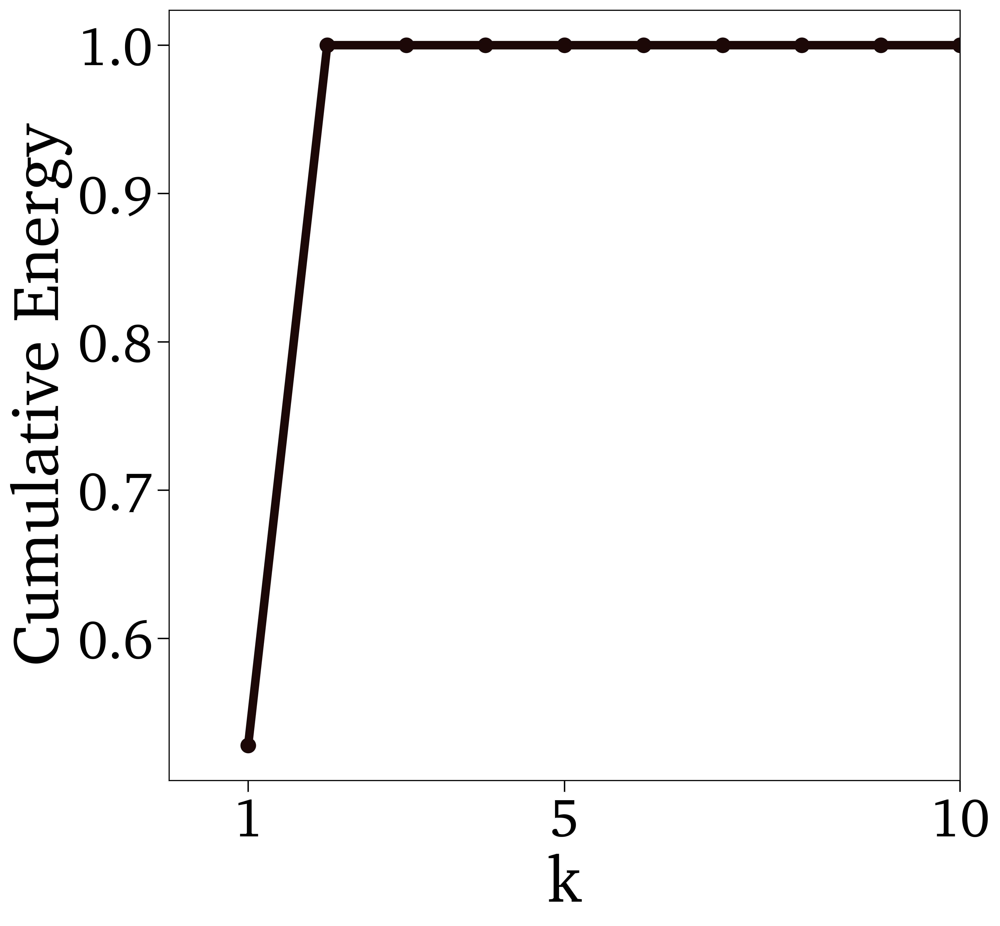

In [7]:
n_modes    = 6
ScalingVec = ['std']#, 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
             # options: 'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

fig, ax1 = plt.subplots()
#fig, ax2 = plt.subplots()
for j, Scaling in enumerate(ScalingVec):

    pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes), nocenter=False)
    C          = pca.X_center
    D          = pca.X_scale
    A          = pca.A[:,0:n_modes].T
    L          = pca.L
    LL         = np.maximum(L,0.)
    AT         = A.T

    plt.plot(np.arange(len(LL))+1, np.cumsum(np.sqrt(LL))/np.sum(np.sqrt(LL)),'-o')
    

plt.xlim([0, 10])
#plt.ylim([0.0, 1.e0])
plt.xlabel('$k$')
plt.ylabel('Cumulative Energy')
plt.xticks([1,5,10])
#plt.yscale('log')

if (FigDir):
    plt.savefig(FigDir+'/MSD_CumEnergy_All.eps', format='eps', bbox_inches='tight')

## Preserving the first $n_{modesFinal}$ Singular Values and Saving the Related Matrixes/Vectors

In [8]:
pca        = PCAA(yMat, scaling='std', n_components=n_modesFinal, nocenter=False)
C          = pca.X_center
D          = pca.X_scale
A          = pca.A[:,0:n_modesFinal].T
L          = pca.L
AT         = A.T
yMat_Scaled= ((yMat - C)/D)
print('[PCA] Shape of A        = ', A.shape)
print('[PCA] ')

[PCA] Shape of A        =  (2, 200)
[PCA] 


In [9]:
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/')
except:
    pass

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/A.csv'
np.savetxt(FileName, A, delimiter=',')

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/C.csv'
np.savetxt(FileName, C, delimiter=',')

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/D.csv'
np.savetxt(FileName, D, delimiter=',')

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/yMat_Scaled.csv'
np.savetxt(FileName, yMat_Scaled, delimiter=',')

### Reduction Error Estimate

In [10]:
#yMat_pca    = pca.transform(yMat, nocenter=False)
yMat_pca   = ((yMat - C)/D).dot(AT)

yMat_      = (yMat_pca.dot(A))*D + C
print('[PCA] Shape of yMat_pca = ', yMat_pca.shape)
print('[PCA]  Max % Error = ', np.max(abs((yMat - yMat_)/yMat)*100))
print('[PCA]  Max      SE = ', np.max((yMat - yMat_)**2))
print('[PCA] Mean % Error = ', np.mean(abs((yMat - yMat_)/yMat)*100))
print('[PCA]          MSE = ', np.mean((yMat - yMat_)**2))

[PCA] Shape of yMat_pca =  (500, 2)
[PCA]  Max % Error =  0.0014038880847267595
[PCA]  Max      SE =  3.1147241863995634e-20
[PCA] Mean % Error =  2.5288702765920305e-08
[PCA]          MSE =  4.147503733904249e-23


In [11]:
AList = []
CList = []
DList = []
for jVar in range(2):
    AList.append(A[:,WList[jVar]])
    CList.append(C[WList[jVar]])
    DList.append(D[WList[jVar]])

### Plotting the Components of the Projection Matrix

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


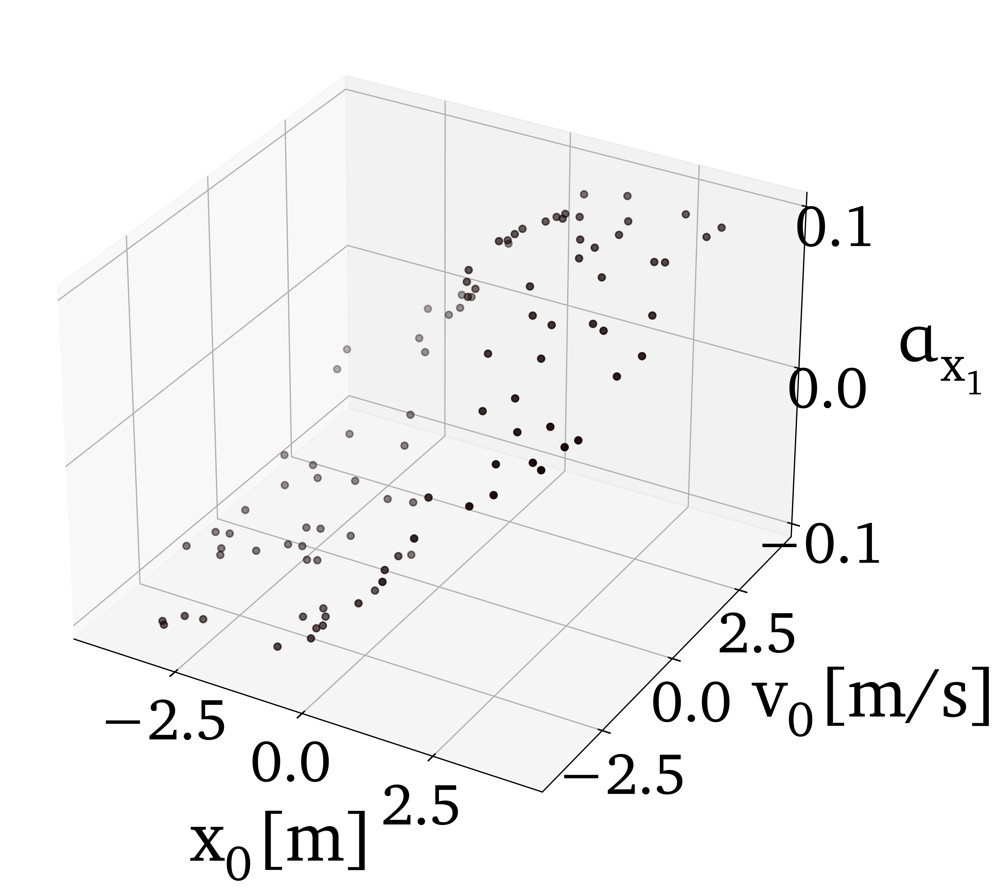

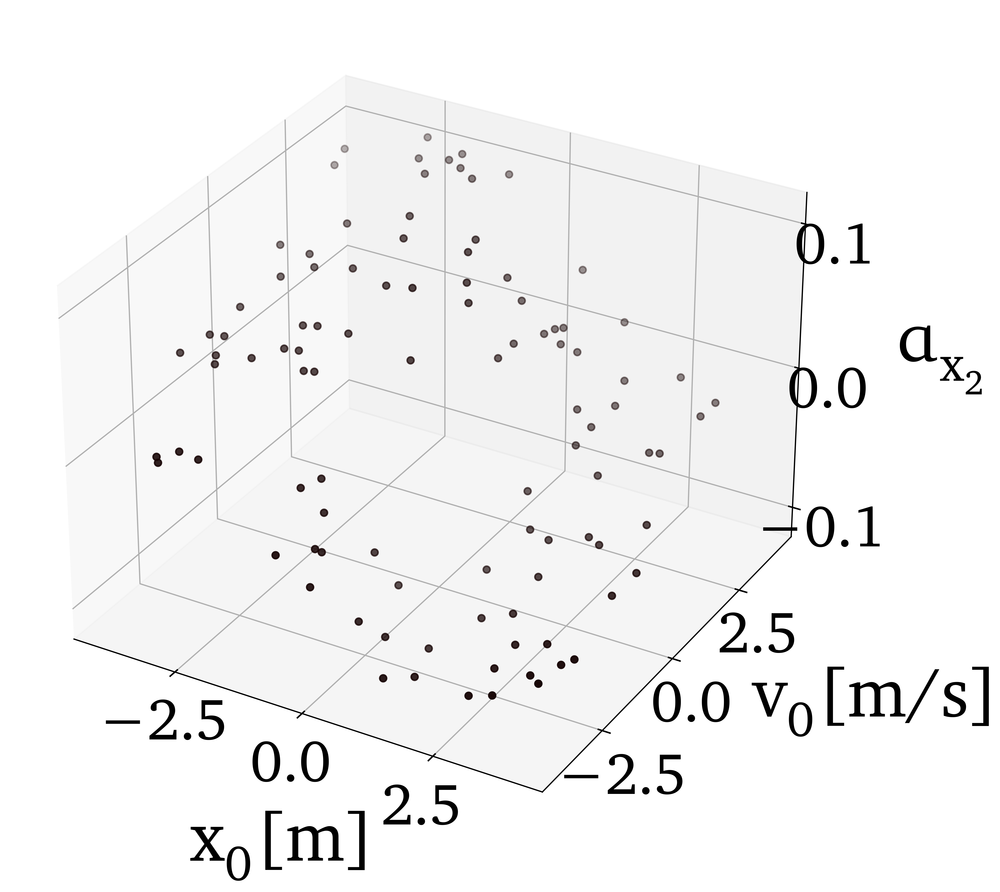

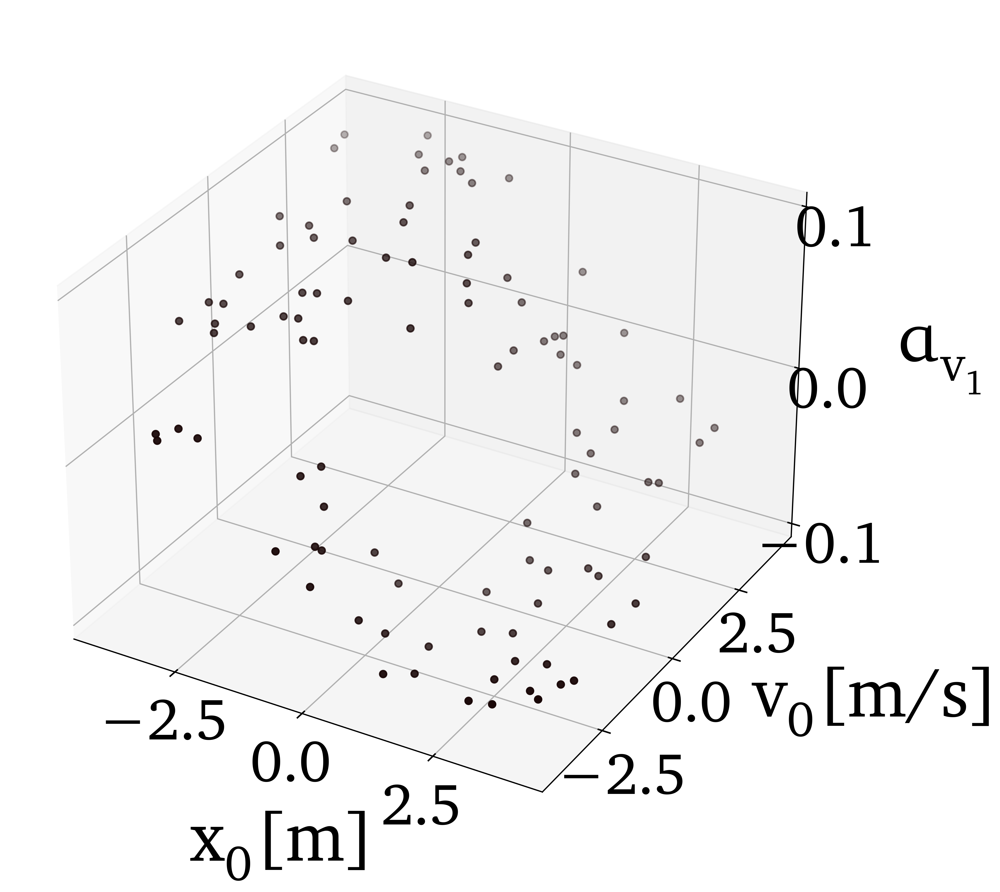

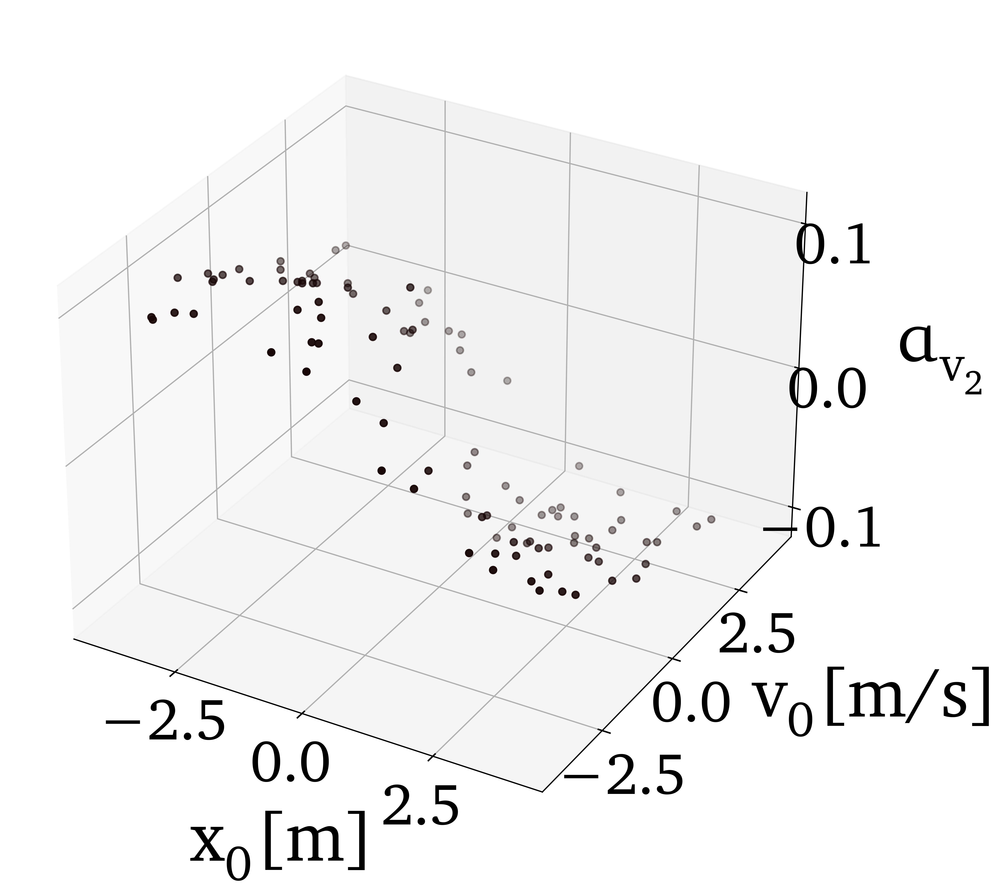

In [12]:
# %matplotlib qt

for iVar in range(2):
    
    for jVar in range(2):
    
        fig = plt.figure()
        ax  = fig.add_subplot(projection='3d')
        ax.scatter(ICs[:,0], ICs[:,1], AList[iVar][jVar,:])
        ax.set_xlabel('\n\n'+r'$x_{0} [m]$', rotation = 0)
        ax.set_ylabel(r'                $v_{0} [m/s]$', rotation = 0)
        ax.set_zlabel(r'        $\alpha_{'+Vars[iVar]+'_'+str(jVar+1)+'}$', rotation = 0)
        ax.xaxis.set_rotate_label(False)
        ax.yaxis.set_rotate_label(False)
        ax.zaxis.set_rotate_label(False)

        if (FigDir):
            plt.savefig(FigDir+'/MSD_All_'+Vars[iVar]+'_Alpha'+str(jVar+1)+'.eps', format='eps', bbox_inches='tight')

### Plotting Eigenmodes

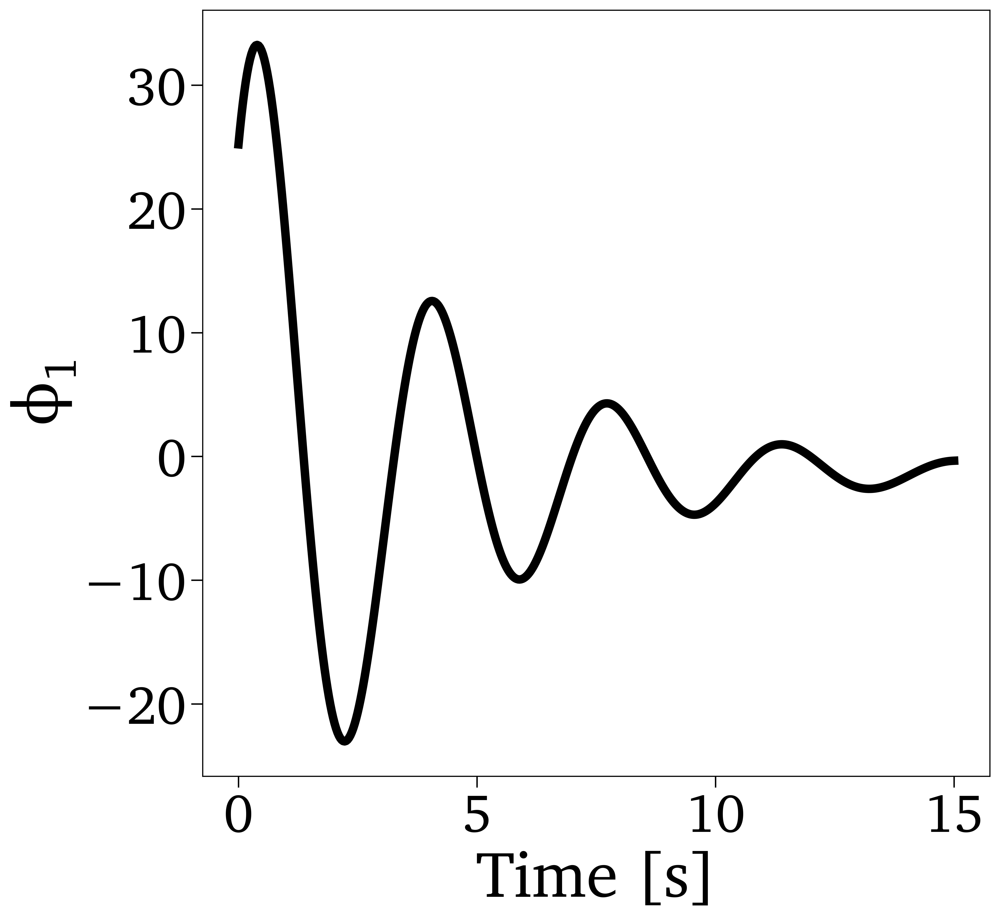

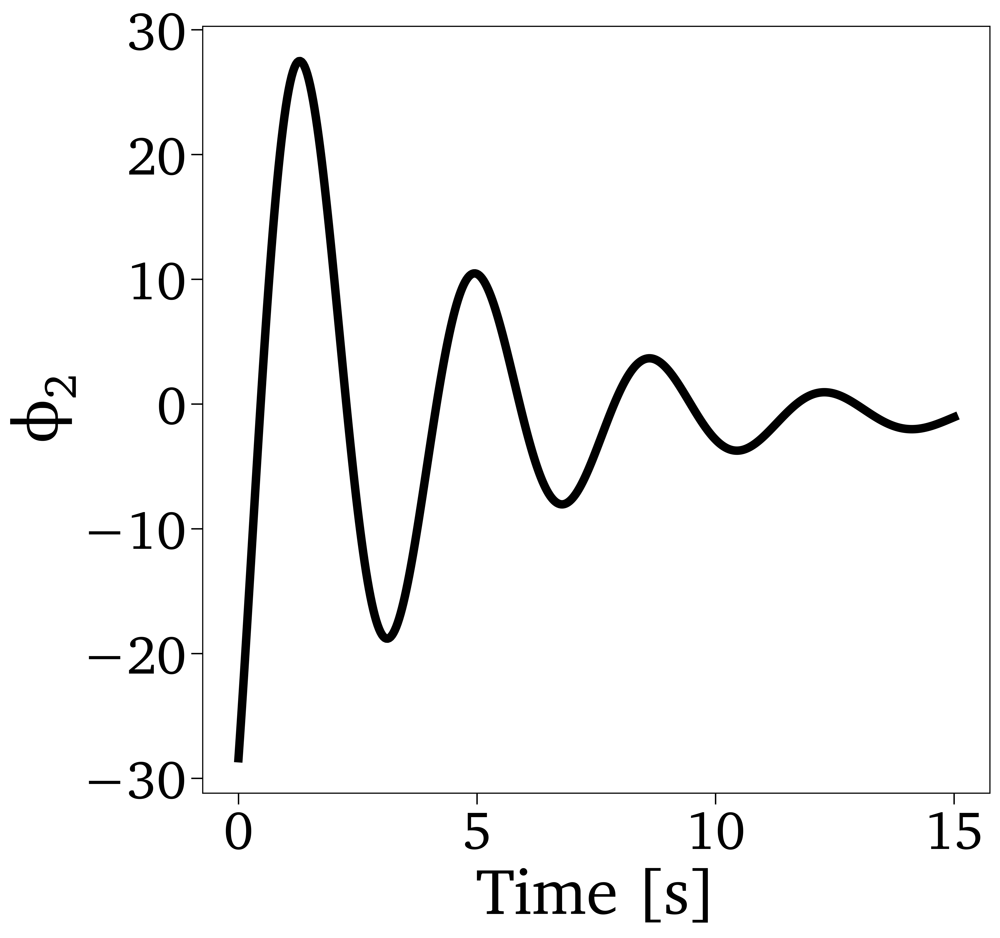

In [13]:
plt.figure()
plt.plot(tVec, yMat_pca[:,0], '-k')
plt.xlabel('Time [s]')
plt.ylabel(r'$\phi_'+str(1)+'}$')

if (FigDir):
    plt.savefig(FigDir+'/MSD_All_phi1.eps', format='eps', bbox_inches='tight')


plt.figure()
plt.plot(tVec, yMat_pca[:,1], '-k')
plt.xlabel('Time [s]')
plt.ylabel(r'$\phi_'+str(2)+'}$')

if (FigDir):
    plt.savefig(FigDir+'/MSD_All_phi2.eps', format='eps', bbox_inches='tight')

### Comparing Original Data vs Encoded-Decoded Data

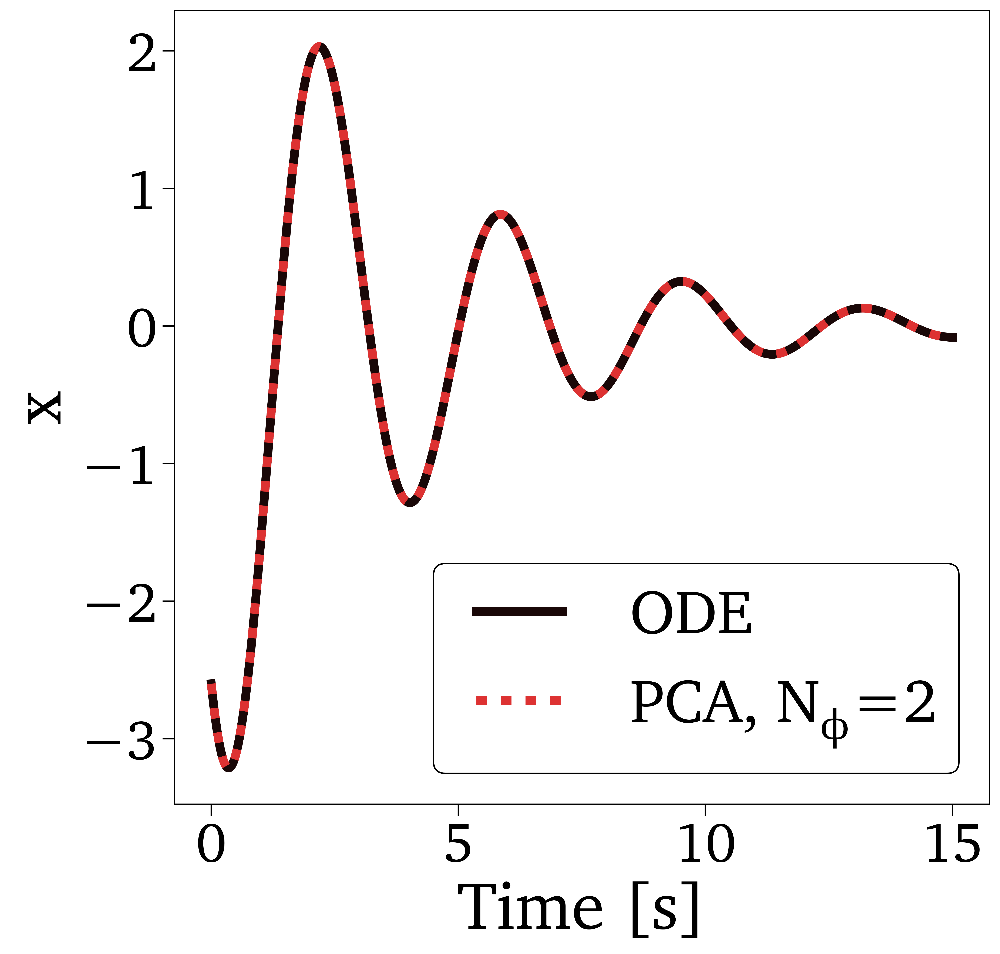

In [14]:
iColumn = 2
for iVar in range(2):
    if (iColumn in WList[iVar]):
        break
iScenario = np.where(iColumn==WList[iVar])

plt.figure()
plt.plot(tVec, yMat[:,iColumn],  '-', label='ODE')
plt.plot(tVec, yMat_[:,iColumn], ':', label='PCA, $N_{\phi}$='+str(n_modesFinal))
plt.xlabel('Time [s]')
plt.ylabel(r''+Vars[iVar])
plt.legend()

## Writing Training and Test Data for the Trunk's and Brunches' FNNs

In [18]:
VarsPCA          = ['PCA_'+str(i_mode+1) for i_mode in range(n_modesFinal)]
Data             = pd.DataFrame(yMat_pca, columns=VarsPCA)
#tVec[tVec == 0.] = FixedMinVal
Data['t']        = tVec
Data['log(t)']   = np.log(tVec)
Data['log10(t)'] = np.log10(tVec)

/usr/local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


### Trunk

In [19]:
from sklearn.model_selection import train_test_split

try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name)
except:
    pass
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/')
except:
    pass
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/train/')
except:
    pass
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/valid/')
except:
    pass
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/test/')
except:
    pass

In [20]:
data_id    = 'pts'

DataNoZero           = Data#[Data['t'] >= FixedMinVal]
n_points             = len(DataNoZero)

idx                  = np.arange(n_points)
train_idx, valid_idx = train_test_split(idx, test_size=valid_perc/100, random_state=42)

n_valid              = len(valid_idx)
n_train              = len(train_idx)


try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/train/'+data_id+'/')
except:
    pass
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/valid/'+data_id+'/')
except:
    pass

DataInput  = DataNoZero[['t', 'log10(t)', 'log(t)'] + VarsPCA]
DataInput.iloc[train_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/train/'+data_id+'/Input.csv', index=False)
DataInput.iloc[valid_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/valid/'+data_id+'/Input.csv', index=False)

DataOutput = DataNoZero[['t', 'log10(t)', 'log(t)'] + VarsPCA]
DataOutput.iloc[train_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/train/'+data_id+'/Output.csv', index=False)
DataOutput.iloc[valid_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/valid/'+data_id+'/Output.csv', index=False)

In [21]:
DataNoZero           = Data
n_points             = len(DataNoZero)

n_test               = n_points


try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/test/ext/')
except:
    pass

DataInput  = DataNoZero[['t', 'log10(t)', 'log(t)'] + VarsPCA]
DataInput.to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/test/ext/Input.csv', index=False)

DataOutput = DataNoZero[['t', 'log10(t)', 'log(t)'] + VarsPCA]
DataOutput.to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Trunk/test/ext/Output.csv', index=False)

### Branches

In [22]:
from sklearn.model_selection import train_test_split

try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name)
except:
    pass

In [23]:
for jVar in range(2):

    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/')
    except:
        pass
    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/train/')
    except:
        pass
    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/valid/')
    except:
        pass
    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/test/')
    except:
        pass

In [24]:
for jVar in range(2):

    data_id    = 'pts'

    n_points             = len(DataIC)

    idx                  = np.arange(n_points)
    train_idx, valid_idx = train_test_split(idx, test_size=valid_perc/100, random_state=42)

    n_valid              = len(valid_idx)
    n_train              = len(train_idx)

    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/train/'+data_id+'/')
    except:
        pass
    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/valid/'+data_id+'/')
    except:
        pass

    DataInput  = DataIC
    DataInput.iloc[train_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/train/'+data_id+'/Input.csv', index=False)
    DataInput.iloc[valid_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/valid/'+data_id+'/Input.csv', index=False)

    DataOutput = pd.DataFrame(np.concatenate([AList[jVar].T, CList[jVar][...,np.newaxis], DList[jVar][...,np.newaxis]], axis=1), columns=['PCA_'+str(i+1) for i in range(A.shape[0])]+['C','D'])
    DataOutput.iloc[train_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/train/'+data_id+'/Output.csv', index=False)
    DataOutput.iloc[valid_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/valid/'+data_id+'/Output.csv', index=False)

In [25]:
for jVar in range(2):

    n_points             = len(DataIC)

    n_test               = n_points

    try:
        os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/test/ext/')
    except:
        pass

    DataInput  = DataIC
    DataInput.to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/test/ext/Input.csv', index=False)

    DataOutput = pd.DataFrame(np.concatenate([AList[jVar].T, CList[jVar][...,np.newaxis], DList[jVar][...,np.newaxis]], axis=1), columns=['PCA_'+str(i+1) for i in range(A.shape[0])]+['C','D'])
    DataOutput.to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_'+str(jVar+1)+'/test/ext/Output.csv', index=False)

In [26]:
### EXPERIMENTING

# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/')
# except:
#     pass
# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/train/')
# except:
#     pass
# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/valid/')
# except:
#     pass
# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/test/')
# except:
#     pass

In [27]:
# data_id    = 'pts'

# n_points             = len(DataIC)


# # idx                  = np.arange(n_points)
# # train_idx, valid_idx = train_test_split(idx, test_size=valid_perc/100, random_state=42)
# idx                  = np.arange(n_points)
# train_idx            = idx
# valid_idx            = idx

# n_valid              = len(valid_idx)
# n_train              = len(train_idx)

# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/train/'+data_id+'/')
# except:
#     pass
# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/valid/'+data_id+'/')
# except:
#     pass

# DataInput  = DataIC
# DataInput.iloc[train_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/train/'+data_id+'/Input.csv', index=False)
# DataInput.iloc[valid_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/valid/'+data_id+'/Input.csv', index=False)

# YY = np.zeros((A.shape[1],A.shape[1]), dtype=int)
# for i in range(YY.shape[0]):
#     YY[i,i] = 1
# DataYY = pd.DataFrame(YY, columns=['IC_'+str(i+1) for i in range(YY.shape[0])])
# DataYY.iloc[train_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/train/'+data_id+'/Output.csv', index=False)
# DataYY.iloc[valid_idx].to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/valid/'+data_id+'/Output.csv', index=False)

In [28]:
# n_points             = len(DataIC)

# n_test               = n_points

# try:
#     os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/test/ext/')
# except:
#     pass

# DataInput  = DataIC
# DataInput.to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/test/ext/Input.csv', index=False)

# YY = np.zeros((A.shape[1],A.shape[1]), dtype=int)
# for i in range(YY.shape[0]):
#     YY[i,i] = 1
# DataYY = pd.DataFrame(YY, columns=['IC_'+str(i+1) for i in range(YY.shape[0])])
# DataYY.to_csv(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/Branch_ICs/test/ext/Output.csv', index=False)